# Lasso and Ridge Regression

#### Build a multiple linear regression with lasso and ridge regularization model on life expectancy in countries dataset to improve the prediction based on the input features. Identify the attributes that influence.

In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer
from feature_engine.outliers import Winsorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score


import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet

from sklearn.model_selection import GridSearchCV

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
life_df = pd.read_csv(r"D:\360digi\DS\Sharath\LogisticReg2_Lasso_Ridge\handson\Datasets_LassoRidge\Life_expectencey_LR.csv")
life_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country                 2938 non-null   object 
 1   Year                    2938 non-null   int64  
 2   Status                  2938 non-null   object 
 3   Life_expectancy         2928 non-null   float64
 4   Adult_Mortality         2928 non-null   float64
 5   infant_deaths           2938 non-null   int64  
 6   Alcohol                 2744 non-null   float64
 7   percentage_expenditure  2938 non-null   float64
 8   Hepatitis_B             2385 non-null   float64
 9   Measles                 2938 non-null   int64  
 10  BMI                     2904 non-null   float64
 11  under_five_deaths       2938 non-null   int64  
 12  Polio                   2919 non-null   float64
 13  Total_expenditure       2712 non-null   float64
 14  Diphtheria              2919 non-null   

In [4]:
life_df.Country.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [5]:
life_df.Status.unique()

array(['Developing', 'Developed'], dtype=object)

In [6]:
life_df.describe()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness,thinness_yr,Income_composition,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [7]:
life_df.isnull().sum()

Country                     0
Year                        0
Status                      0
Life_expectancy            10
Adult_Mortality            10
infant_deaths               0
Alcohol                   194
percentage_expenditure      0
Hepatitis_B               553
Measles                     0
BMI                        34
under_five_deaths           0
Polio                      19
Total_expenditure         226
Diphtheria                 19
HIV_AIDS                    0
GDP                       448
Population                652
thinness                   34
thinness_yr                34
Income_composition        167
Schooling                 163
dtype: int64

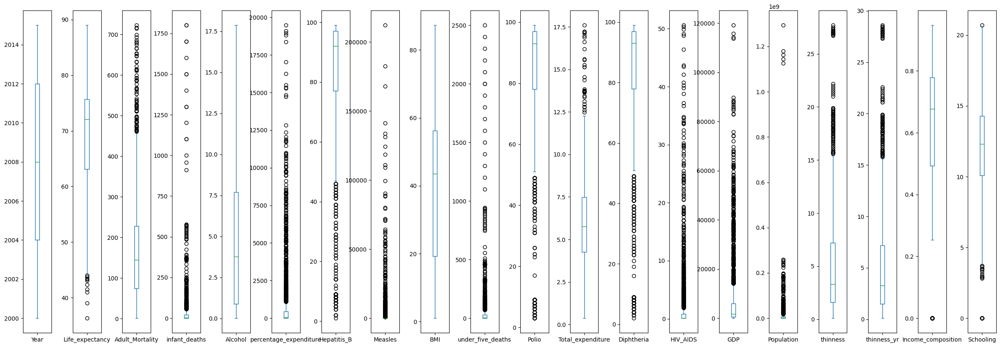

In [8]:
# box plot visualisation
life_df.plot(kind = 'box', subplots = True, sharey = False, figsize = (30,10))
plt.subplots_adjust(wspace = 0.75)
plt.show()

In [9]:
# Seperating input and output variables 
X = pd.DataFrame(life_df.iloc[:, 1:])
Y = pd.DataFrame(life_df.iloc[:, 0])

In [10]:
Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  2938 non-null   object
dtypes: object(1)
memory usage: 23.1+ KB


In [11]:
Y['nCountry'] = Y['Country']
Y['nCountry']

0       Afghanistan
1       Afghanistan
2       Afghanistan
3       Afghanistan
4       Afghanistan
           ...     
2933       Zimbabwe
2934       Zimbabwe
2935       Zimbabwe
2936       Zimbabwe
2937       Zimbabwe
Name: nCountry, Length: 2938, dtype: object

In [12]:
for k, cont in enumerate(Y.Country.unique()):
    Y.loc[Y['nCountry']==cont,'nCountry'] = k

In [13]:
#Y['nCountry'].unique()
Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Country   2938 non-null   object
 1   nCountry  2938 non-null   object
dtypes: object(2)
memory usage: 46.0+ KB


In [14]:
Y['nCountry'] = Y['nCountry'].astype(float)

In [15]:
Y

,Country,nCountry
0,Afghanistan,0.0
1,Afghanistan,0.0
2,Afghanistan,0.0
3,Afghanistan,0.0
4,Afghanistan,0.0
...,...,...
2933,Zimbabwe,192.0
2934,Zimbabwe,192.0
2935,Zimbabwe,192.0
2936,Zimbabwe,192.0


# Data Preprocessing

In [16]:
# Select numeric features for data preprocessing
numeric_features = X.select_dtypes(exclude = ['object']).columns
print(numeric_features)

Index(['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
       'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria',
       'HIV_AIDS', 'GDP', 'Population', 'thinness', 'thinness_yr',
       'Income_composition', 'Schooling'],
      dtype='object')


In [17]:
categorical_features = X.select_dtypes(include = ['object']).columns
print(categorical_features)

Index(['Status'], dtype='object')


In [18]:
# Winsorization for outlier treatment
winsor = Winsorizer(capping_method = 'iqr', tail = 'both', fold = 1.5, variables = list(numeric_features))
winsor

Winsorizer(capping_method='iqr', fold=1.5, tail='both',
           variables=['Year', 'Life_expectancy', 'Adult_Mortality',
                      'infant_deaths', 'Alcohol', 'percentage_expenditure',
                      'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths',
                      'Polio', 'Total_expenditure', 'Diphtheria', 'HIV_AIDS',
                      'GDP', 'Population', 'thinness', 'thinness_yr',
                      'Income_composition', 'Schooling'])

In [19]:
# Missing values Analysis
num_pipeline = Pipeline(steps = [('impute', SimpleImputer(strategy = 'mean'))])
num_pipeline

Pipeline(steps=[('impute', SimpleImputer())])

In [20]:
outlier_pipeline = Pipeline(steps = [('winsor', winsor)])
outlier_pipeline

Pipeline(steps=[('winsor',
                 Winsorizer(capping_method='iqr', fold=1.5, tail='both',
                            variables=['Year', 'Life_expectancy',
                                       'Adult_Mortality', 'infant_deaths',
                                       'Alcohol', 'percentage_expenditure',
                                       'Hepatitis_B', 'Measles', 'BMI',
                                       'under_five_deaths', 'Polio',
                                       'Total_expenditure', 'Diphtheria',
                                       'HIV_AIDS', 'GDP', 'Population',
                                       'thinness', 'thinness_yr',
                                       'Income_composition', 'Schooling']))])

In [21]:
preprocessor = ColumnTransformer(transformers = [('num', num_pipeline, numeric_features)])
print(preprocessor)

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('impute', SimpleImputer())]),
                                 Index(['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
       'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria',
       'HIV_AIDS', 'GDP', 'Population', 'thinness', 'thinness_yr',
       'Income_composition', 'Schooling'],
      dtype='object'))])


In [22]:
preprocessor1 = ColumnTransformer(transformers = [('wins', outlier_pipeline, numeric_features)])
print(preprocessor1)

ColumnTransformer(transformers=[('wins',
                                 Pipeline(steps=[('winsor',
                                                  Winsorizer(capping_method='iqr',
                                                             fold=1.5,
                                                             tail='both',
                                                             variables=['Year',
                                                                        'Life_expectancy',
                                                                        'Adult_Mortality',
                                                                        'infant_deaths',
                                                                        'Alcohol',
                                                                        'percentage_expenditure',
                                                                        'Hepatitis_B',
                                                    

In [23]:
# Fit the imputation pipeline to input features
imputation = preprocessor.fit(X)

In [24]:
# Transformed data
cleandata = pd.DataFrame(imputation.transform(X), columns = numeric_features)
cleandata.head()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness,thinness_yr,Income_composition,Schooling
0,2015.0,65.0,263.0,62.0,0.01,71.279624,65.0,1154.0,19.1,83.0,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014.0,59.9,271.0,64.0,0.01,73.523582,62.0,492.0,18.6,86.0,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013.0,59.9,268.0,66.0,0.01,73.219243,64.0,430.0,18.1,89.0,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012.0,59.5,272.0,69.0,0.01,78.184215,67.0,2787.0,17.6,93.0,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011.0,59.2,275.0,71.0,0.01,7.097109,68.0,3013.0,17.2,97.0,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [25]:
cleandata.isnull().sum()

Year                      0
Life_expectancy           0
Adult_Mortality           0
infant_deaths             0
Alcohol                   0
percentage_expenditure    0
Hepatitis_B               0
Measles                   0
BMI                       0
under_five_deaths         0
Polio                     0
Total_expenditure         0
Diphtheria                0
HIV_AIDS                  0
GDP                       0
Population                0
thinness                  0
thinness_yr               0
Income_composition        0
Schooling                 0
dtype: int64

In [26]:
clean = preprocessor1.fit(cleandata)
clean

ColumnTransformer(transformers=[('wins',
                                 Pipeline(steps=[('winsor',
                                                  Winsorizer(capping_method='iqr',
                                                             fold=1.5,
                                                             tail='both',
                                                             variables=['Year',
                                                                        'Life_expectancy',
                                                                        'Adult_Mortality',
                                                                        'infant_deaths',
                                                                        'Alcohol',
                                                                        'percentage_expenditure',
                                                                        'Hepatitis_B',
                                                    

In [27]:
cleandata1 = pd.DataFrame(clean.transform(cleandata), columns = numeric_features)
cleandata1.head()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness,thinness_yr,Income_composition,Schooling
0,2015.0,65.0,263.0,55.0,0.01,71.279624,65.0,900.625,19.1,70.0,49.5,8.16,65.0,0.1,584.259210,3.125506e+07,15.35,15.6,0.479,10.1
1,2014.0,59.9,271.0,55.0,0.01,73.523582,62.0,492.000,18.6,70.0,58.0,8.18,62.0,0.1,612.696514,3.275820e+05,15.35,15.6,0.476,10.0
2,2013.0,59.9,268.0,55.0,0.01,73.219243,64.0,430.000,18.1,70.0,62.0,8.13,64.0,0.1,631.744976,3.125506e+07,15.35,15.6,0.470,9.9
3,2012.0,59.5,272.0,55.0,0.01,78.184215,67.0,900.625,17.6,70.0,67.0,8.52,67.0,0.1,669.959000,3.696958e+06,15.35,15.6,0.463,9.8
4,2011.0,59.2,275.0,55.0,0.01,7.097109,68.0,900.625,17.2,70.0,68.0,7.87,68.0,0.1,63.537231,2.978599e+06,15.35,15.6,0.454,9.5


In [28]:
## Scaling with MinMaxScaler
scale_pipeline = Pipeline([('scale', MinMaxScaler())])

scale_columntransfer = ColumnTransformer([('scale', scale_pipeline, numeric_features)]) # Skips the transformations for remaining columns

scale = scale_columntransfer.fit(cleandata1)

In [29]:
scaled_data = pd.DataFrame(scale.transform(cleandata1), columns = numeric_features)
scaled_data.describe()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness,thinness_yr,Income_composition,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000
mean,0.501248,0.554838,0.353511,0.247911,0.272924,0.258975,0.646686,0.259537,0.432459,0.256657,0.723009,0.485487,0.721876,0.249266,0.288310,0.245772,0.301986,0.298331,0.626310,0.489722
std,0.307589,0.213505,0.253532,0.347435,0.232640,0.355081,0.314981,0.392630,0.230912,0.359922,0.319175,0.200828,0.318793,0.396225,0.313808,0.284658,0.257720,0.256346,0.226598,0.203996
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.266667,0.418919,0.160263,0.000000,0.064334,0.004272,0.555718,0.000000,0.213210,0.000000,0.575758,0.350877,0.575758,0.000000,0.032452,0.013402,0.098361,0.096774,0.475085,0.375000
50%,0.533333,0.617117,0.313941,0.054545,0.246638,0.059184,0.704789,0.018876,0.486674,0.057143,0.878788,0.488438,0.878788,0.000000,0.174645,0.117610,0.216393,0.212903,0.661689,0.493421
75%,0.800000,0.698198,0.496158,0.400000,0.438600,0.402563,0.926197,0.400000,0.638470,0.400000,0.959596,0.610526,0.959596,0.400000,0.419471,0.408041,0.459016,0.458065,0.791808,0.625000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [30]:
## Encoding
# Categorical features
encoding_pipeline = Pipeline([('onehot', OneHotEncoder())])

preprocess_pipeline = ColumnTransformer([('categorical', encoding_pipeline, categorical_features)])

clean =  preprocess_pipeline.fit(X)


In [31]:
encode_data = pd.DataFrame(clean.transform(X))
encode_data

,0,1
0,0.0,1.0
1,0.0,1.0
2,0.0,1.0
3,0.0,1.0
4,0.0,1.0
...,...,...
2933,0.0,1.0
2934,0.0,1.0
2935,0.0,1.0
2936,0.0,1.0


In [32]:
# To get feature names for Categorical columns after Onehotencoding 
encode_data.columns = clean.get_feature_names_out(input_features = X.columns)
encode_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 2 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   categorical__Status_Developed   2938 non-null   float64
 1   categorical__Status_Developing  2938 non-null   float64
dtypes: float64(2)
memory usage: 46.0 KB


In [33]:
clean_data = pd.concat([scaled_data, encode_data], axis = 1)  # concatenated data will have new sequential index
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Year                            2938 non-null   float64
 1   Life_expectancy                 2938 non-null   float64
 2   Adult_Mortality                 2938 non-null   float64
 3   infant_deaths                   2938 non-null   float64
 4   Alcohol                         2938 non-null   float64
 5   percentage_expenditure          2938 non-null   float64
 6   Hepatitis_B                     2938 non-null   float64
 7   Measles                         2938 non-null   float64
 8   BMI                             2938 non-null   float64
 9   under_five_deaths               2938 non-null   float64
 10  Polio                           2938 non-null   float64
 11  Total_expenditure               2938 non-null   float64
 12  Diphtheria                      29

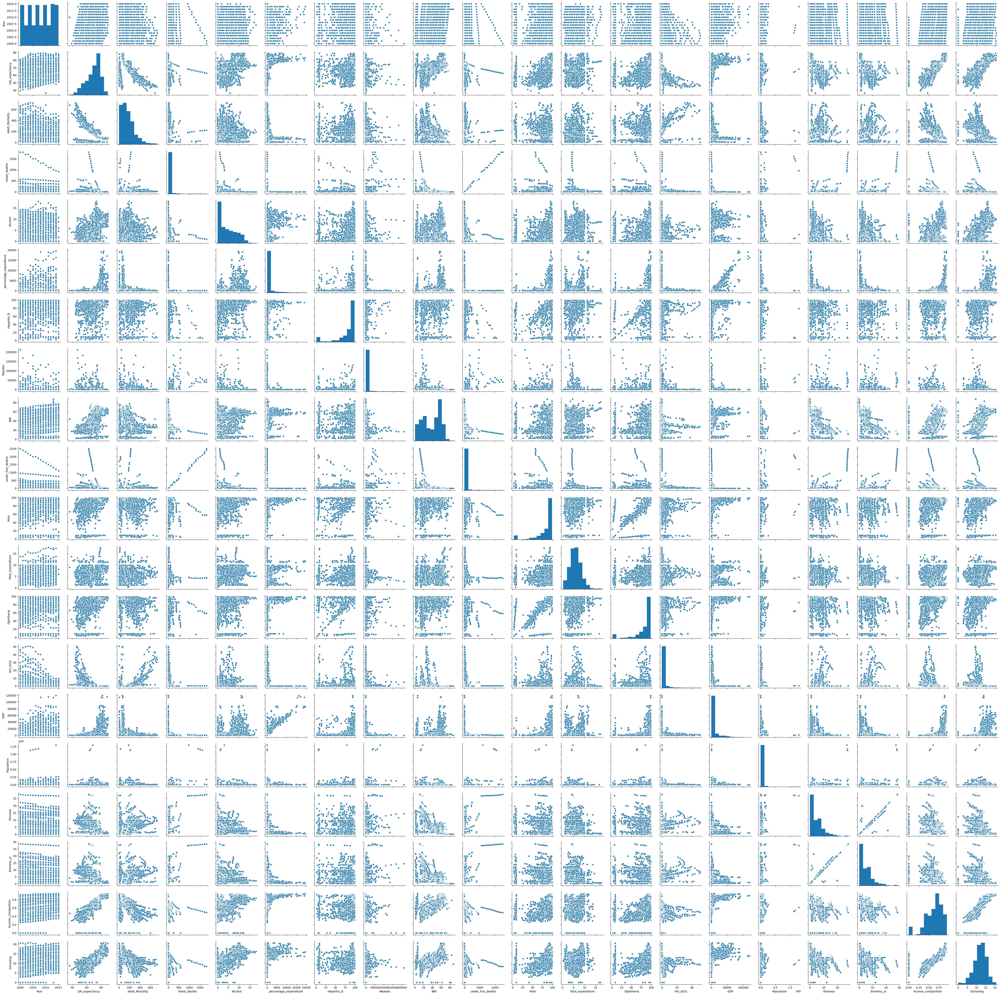

In [34]:
# Multivariate Analysis
sns.pairplot(life_df)

In [35]:
# Correlation Analysis on Original Data
orig_df_cor = life_df.corr()
orig_df_cor

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness,thinness_yr,Income_composition,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Life_expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult_Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant_deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage_expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis_B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under_five_deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373


In [ ]:
# Collinearity between input pairs observed:
# Income_composition - Life_expectancy : 0.7247
# Schooling - Life_expectancy : 0.7519
# under_five_deaths - infant_deaths : 0.9966
# GDP - percentage_expenditure : 0.8993

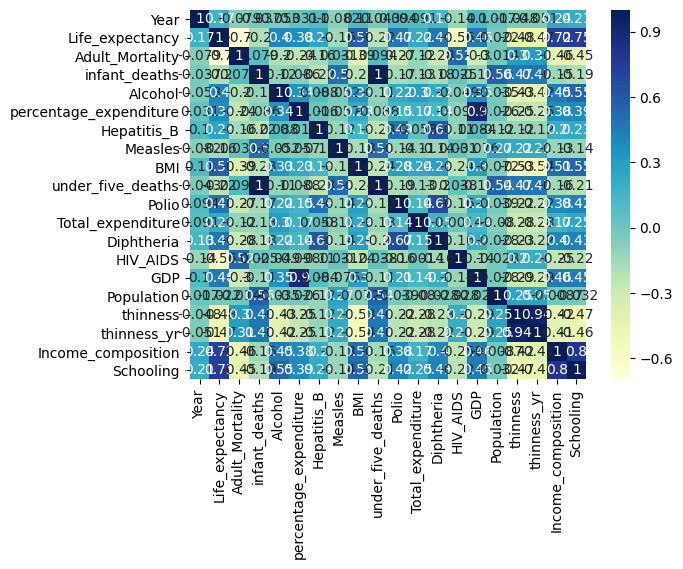

In [36]:
# Heatmap
dataplot = sns.heatmap(orig_df_cor, annot = True, cmap = "YlGnBu")

In [37]:
# Splitting data into training and testing data set
X_train, X_test, Y_train, Y_test = train_test_split(clean_data, Y, test_size = 0.2, random_state = 0)#, stratify = Y)

In [39]:
Y_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2350 entries, 683 to 2732
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Country   2350 non-null   object 
 1   nCountry  2350 non-null   float64
dtypes: float64(1), object(1)
memory usage: 55.1+ KB


In [ ]:
#Y.Country.value_counts()

In [40]:
Y_train

,Country,nCountry
683,Cyprus,43.0
478,Cambodia,29.0
2359,Slovenia,155.0
971,Gambia,62.0
880,Estonia,56.0
...,...,...
763,Djibouti,48.0
835,Equatorial Guinea,54.0
1653,Mauritania,106.0
2607,Timor-Leste,171.0


# Multiple Linear Regression

In [ ]:
# As Y has more than two categories we will apply multiple logistic regression

In [41]:
# ‘multinomial’ option is supported only by the ‘lbfgs’ and ‘newton-cg’ solvers
logmodel = LogisticRegression(multi_class = "multinomial", solver = "newton-cg")

In [42]:
# Train the model
model = logmodel.fit(X_train, Y_train.nCountry)

In [43]:
# Train accuracy 
train_predict = model.predict(X_train)

In [44]:
# Train predictions
accuracy_score(Y_train.nCountry, train_predict) 

0.6723404255319149

In [45]:
logmodel.coef_

array([[ 0.79195384, -0.60252383,  0.65449062, ..., -0.22784839,
        -0.01117063,  0.01117063],
       [-0.09485678,  0.59088985, -1.63939821, ..., -0.41168609,
        -0.61798947,  0.61798957],
       [-0.29024552,  0.72440492, -0.54140086, ...,  0.49782326,
        -0.36465905,  0.36466007],
       ...,
       [ 0.11923008, -0.28800151,  0.38681929, ..., -0.89420741,
        -0.08100143,  0.08100255],
       [ 0.48962225, -0.81841902,  0.66256151, ...,  1.1130787 ,
        -0.07604345,  0.07604401],
       [-0.21980014, -1.9283846 ,  1.51990071, ...,  0.17697815,
        -0.06133669,  0.06133724]])

In [46]:
logmodel.intercept_

array([-0.70696706, -0.75596864, -0.80882884,  0.20202356, -0.620199  ,
       -2.39039424,  2.22426469, -1.36798953,  1.17928048,  3.57701211,
       -2.07481411, -2.67834136, -1.63446421, -0.53417808, -1.4840127 ,
       -0.79379912, -0.20533681,  1.66426912, -0.440623  ,  2.49970433,
        1.55774011, -4.16710096, -5.28467579, -1.76052214,  0.84219908,
        0.35465408, -0.4107424 , -2.64596269,  1.42331595,  0.8262055 ,
       -0.94733139, -1.29424087,  4.71553508,  2.98887145, -1.18778756,
       -2.18889988,  1.50373965,  5.48216434,  0.76403576, -1.54071038,
        1.19828585,  0.82241789, -2.0332301 , -0.48775597,  0.47219055,
        0.82591946, -2.01340135,  0.41759253,  2.27466649, -1.50093952,
        0.67338365,  2.18526144, -4.11137663,  1.64401399,  3.53827431,
        3.02681245, -2.24829146,  0.41366093, -0.23849244, -4.34579116,
       -3.83493001,  1.23393727, -1.26452568,  1.17507707, -1.80429411,
       -0.71231236, -4.38567049, -0.43980735,  3.62052704,  3.63

In [47]:
# Predict the results for Test Data
test_predict = model.predict(X_test)

In [48]:
# Test accuracy 
accuracy_score(Y_test.nCountry, test_predict)

0.467687074829932

In [49]:
# Hyperparameter Optimization
logmodel1 = LogisticRegression(multi_class = "multinomial")

In [50]:
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

In [ ]:
# from sklearn.model_selection import GridSearchCV
clf = GridSearchCV(logmodel1, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)
best_clf = clf.fit(X_train, Y_train.nCountry)

In [ ]:
# Best estimator
best_clf.best_estimator_

In [ ]:
print (f'Accuracy - : {best_clf.score(X_train, Y_train):.3f}')

In [ ]:
print (f'Accuracy - : {best_clf.score(X_test, Y_test):.3f}')

In [ ]:
###################################

In [51]:
C = add_constant(clean_data)
basemodel = sm.OLS(Y.nCountry, C).fit()
basemodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               nCountry   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     5.161
Date:                Mon, 13 Mar 2023   Prob (F-statistic):           1.81e-13
Time:                        00:15:49   Log-Likelihood:                -15954.
No. Observations:                2938   AIC:                         3.195e+04
Df Residuals:                    2916   BIC:                         3.208e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             71.7260      6.557     10.938      0.000      58.869      84.583
Year                               1.4071      3.604      0.390      0.696      -5.660       8.474
Life_expectancy                  -22.5791     12.634     -1.787      0.074     -47.352       2.194
Adult_Mortality                   13.2372      5.708      2.319      0.020       2.046      24.429
infant_deaths                    -23.8765     31.191     -0.765      0.444     -85.035      37.282
Alcohol                          -26.4308      6.068     -4.356      0.000     -38.328     -14.534
percentage_expenditure           -13.0470      4.488     -2.907      0.004     -21.847      -4.247
Hepatitis_B                       -9.9776      4.328     -2.305      0.021     -18.464      -1.491
Measles                            8.7184      3.333      2.616      0.009       2.183      15.254
BMI                               14.1219      6.029      2.342      0.019       2.301      25.943
under_five_deaths                 10.7819     30.959      0.348      0.728     -49.922      71.486
Polio                             12.5450      6.270      2.001      0.046       0.251      24.839
Total_expenditure                 18.1689      5.618      3.234      0.001       7.153      29.185
Diphtheria                        -4.4839      6.543     -0.685      0.493     -17.314       8.346
HIV_AIDS                         -15.9402      4.595     -3.469      0.001     -24.950      -6.931
GDP                                4.3257      5.142      0.841      0.400      -5.756      14.407
Population                         5.0902      4.076      1.249      0.212      -2.901      13.082
thinness                         -26.6409     12.074     -2.206      0.027     -50.316      -2.966
thinness_yr                       37.1598     12.214      3.042      0.002      13.211      61.109
Income_composition                -3.8416      8.768     -0.438      0.661     -21.035      13.351
Schooling                         -2.7936     10.300     -0.271      0.786     -22.990      17.403
categorical__Status_Developed     45.0323      4.317     10.432      0.000      36.568      53.496
categorical__Status_Developing    26.6937      3.130      8.528      0.000      20.556      32.831
==============================================================================
Omnibus:                     1120.582   Durbin-Watson:                   0.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              146.631
Skew:                           0.026   Prob(JB):                     1.44e-32
Kurtosis:                       1.907   Cond. No.                     4.63e+15
==============================================================================

Notes:
[1] Standard Errors assume 

In [ ]:
# R-squared: 0.036

In [52]:
# Identify the variable with highest collinearity using 'Variance Inflation Factor(VIF)'
# VIF = 1/(1-R*R)
# Assume VIF > 10 = collinearity

vif = pd.Series([variance_inflation_factor(C.values, i) for i in range(C.shape[1])], index = C.columns)
vif

const                               0.000000
Year                                1.174827
Life_expectancy                     6.955169
Adult_Mortality                     2.001669
infant_deaths                     112.251440
Alcohol                             1.904546
percentage_expenditure              2.427663
Hepatitis_B                         1.776358
Measles                             1.637115
BMI                                 1.852306
under_five_deaths                 118.681043
Polio                               3.828225
Total_expenditure                   1.216839
Diphtheria                          4.159077
HIV_AIDS                            3.168138
GDP                                 2.488290
Population                          1.286627
thinness                            9.255465
thinness_yr                         9.370650
Income_composition                  3.773540
Schooling                           4.220221
categorical__Status_Developed            inf
categorica

In [ ]:
# col on Index 0, 8 shows highest VIF 
# under_five_deaths is showing high VIF value

In [53]:
# Drop colinearity variable - variable 'Weight'
clean_data1 = C.drop('under_five_deaths', axis = 1)
clean_data1.columns

Index(['const', 'Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
       'Polio', 'Total_expenditure', 'Diphtheria', 'HIV_AIDS', 'GDP',
       'Population', 'thinness', 'thinness_yr', 'Income_composition',
       'Schooling', 'categorical__Status_Developed',
       'categorical__Status_Developing'],
      dtype='object')

In [54]:
# Build a model on dataset
basemodel2 = sm.OLS(Y.nCountry, clean_data1).fit()
basemodel2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               nCountry   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     5.414
Date:                Mon, 13 Mar 2023   Prob (F-statistic):           7.98e-14
Time:                        00:20:00   Log-Likelihood:                -15954.
No. Observations:                2938   AIC:                         3.195e+04
Df Residuals:                    2917   BIC:                         3.208e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             72.2603      6.374     11.336      0.000      59.762      84.759
Year                               1.4806      3.598      0.412      0.681      -5.573       8.535
Life_expectancy                  -23.3616     12.431     -1.879      0.060     -47.736       1.013
Adult_Mortality                   13.1769      5.704      2.310      0.021       1.992      24.362
infant_deaths                    -13.1307      4.562     -2.878      0.004     -22.077      -4.185
Alcohol                          -26.4888      6.064     -4.368      0.000     -38.380     -14.598
percentage_expenditure           -12.9747      4.483     -2.894      0.004     -21.764      -4.185
Hepatitis_B                       -9.9744      4.327     -2.305      0.021     -18.459      -1.489
Measles                            8.7361      3.332      2.622      0.009       2.202      15.270
BMI                               14.0080      6.019      2.327      0.020       2.206      25.809
Polio                             12.4917      6.267      1.993      0.046       0.203      24.780
Total_expenditure                 18.1935      5.617      3.239      0.001       7.180      29.207
Diphtheria                        -4.4507      6.542     -0.680      0.496     -17.277       8.376
HIV_AIDS                         -15.7676      4.567     -3.452      0.001     -24.723      -6.812
GDP                                4.3350      5.141      0.843      0.399      -5.745      14.415
Population                         5.0036      4.068      1.230      0.219      -2.972      12.979
thinness                         -26.5712     12.071     -2.201      0.028     -50.239      -2.903
thinness_yr                       37.0375     12.207      3.034      0.002      13.102      60.973
Income_composition                -3.9869      8.757     -0.455      0.649     -21.158      13.184
Schooling                         -2.9787     10.285     -0.290      0.772     -23.145      17.188
categorical__Status_Developed     45.3985      4.186     10.845      0.000      37.191      53.606
categorical__Status_Developing    26.8618      3.092      8.687      0.000      20.799      32.925
==============================================================================
Omnibus:                     1113.996   Durbin-Watson:                   0.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              146.378
Skew:                           0.026   Prob(JB):                     1.64e-32
Kurtosis:                       1.908   Cond. No.                     4.61e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 7.8

In [ ]:
# R-squared:0.036

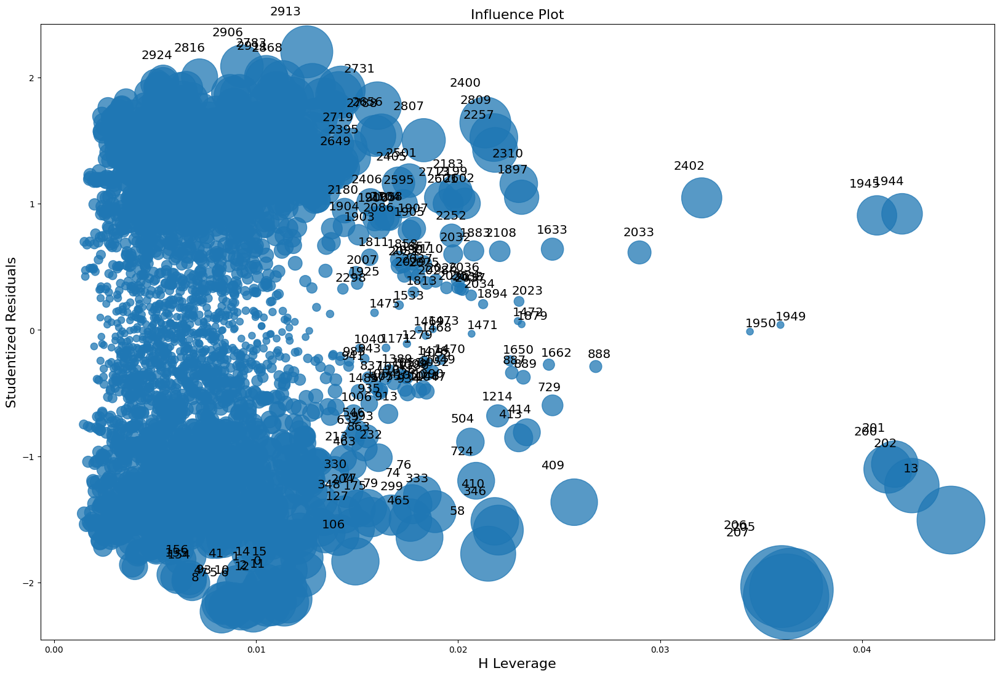

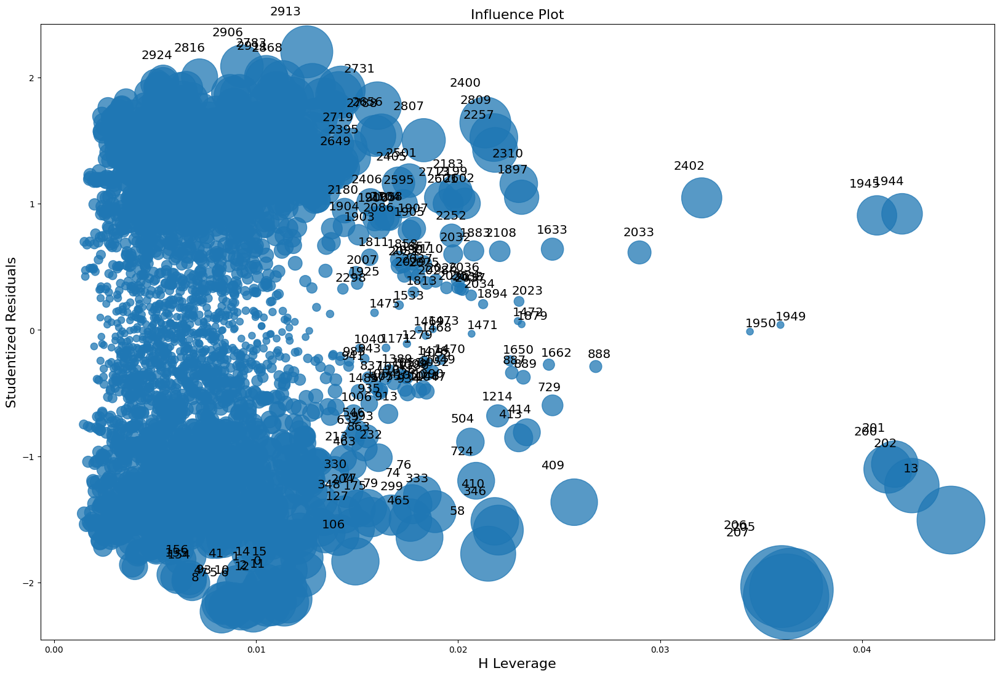

In [55]:
plt.rcParams["figure.figsize"] = (20,13)
sm.graphics.influence_plot(basemodel2, size=100, plot_alpha=0.75)

In [56]:
# Remove few influential observations to tune the model and verify 
clean_data1_new = clean_data1.drop(clean_data1.index[[2913, 2906, 2816, 2924,2783, 2731, 2400, 2809, 2402, 1945, 1944, 1950, 1949, 201, 200, 202, 13, 206, 207]])
Y_new = Y.drop(Y.index[[2913, 2906, 2816, 2924,2783, 2731, 2400, 2809, 2402, 1945, 1944, 1950, 1949, 201, 200, 202, 13, 206, 207]])

In [57]:
# Build model on new dataset
basemodel3 = sm.OLS(Y_new.nCountry, clean_data1_new).fit()
basemodel3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               nCountry   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     5.960
Date:                Mon, 13 Mar 2023   Prob (F-statistic):           9.49e-16
Time:                        00:21:42   Log-Likelihood:                -15837.
No. Observations:                2919   AIC:                         3.172e+04
Df Residuals:                    2898   BIC:                         3.184e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             73.0535      6.373     11.464      0.000      60.558      85.549
Year                               0.6242      3.592      0.174      0.862      -6.419       7.667
Life_expectancy                  -23.0759     12.401     -1.861      0.063     -47.392       1.240
Adult_Mortality                   14.1532      5.717      2.476      0.013       2.944      25.363
infant_deaths                    -13.5212      4.577     -2.954      0.003     -22.495      -4.547
Alcohol                          -27.4621      6.043     -4.545      0.000     -39.310     -15.614
percentage_expenditure           -12.9379      4.479     -2.888      0.004     -21.721      -4.155
Hepatitis_B                       -9.9643      4.322     -2.306      0.021     -18.438      -1.490
Measles                           10.0946      3.326      3.035      0.002       3.573      16.616
BMI                               15.3932      6.037      2.550      0.011       3.555      27.231
Polio                             14.9958      6.293      2.383      0.017       2.657      27.334
Total_expenditure                 17.0895      5.611      3.046      0.002       6.088      28.091
Diphtheria                        -5.7322      6.556     -0.874      0.382     -18.588       7.123
HIV_AIDS                         -17.5088      4.587     -3.817      0.000     -26.503      -8.515
GDP                                4.4355      5.130      0.865      0.387      -5.624      14.495
Population                         4.4830      4.077      1.100      0.272      -3.510      12.476
thinness                         -29.3424     14.891     -1.971      0.049     -58.540      -0.145
thinness_yr                       40.2030     15.066      2.668      0.008      10.662      69.744
Income_composition                -3.8879      8.718     -0.446      0.656     -20.983      13.207
Schooling                         -6.6684     10.271     -0.649      0.516     -26.808      13.471
categorical__Status_Developed     46.1401      4.182     11.034      0.000      37.941      54.340
categorical__Status_Developing    26.9133      3.090      8.711      0.000      20.855      32.972
==============================================================================
Omnibus:                     1038.440   Durbin-Watson:                   0.026
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              142.606
Skew:                           0.023   Prob(JB):                     1.08e-31
Kurtosis:                       1.918   Cond. No.                     1.07e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.4

In [ ]:
# R-squared: 0.040

# Regularization Techniques: LASSO, RIDGE and Elasticnet Regression

## LASSO MODEL

In [58]:
lasso = Lasso(alpha = 0.13, normalize = True)

In [59]:
lasso.fit(clean_data1_new, Y_new.nCountry)

Lasso(alpha=0.13, normalize=True)

In [60]:
# Coefficient values for all independent variables
lasso.coef_

array([ 0., -0., -0.,  0.,  0., -0., -0., -0.,  0.,  0.,  0.,  0., -0.,
       -0., -0.,  0.,  0.,  0., -0., -0.,  0., -0.])

In [61]:
lasso.intercept_

94.95991778006166

<BarContainer object of 22 artists>

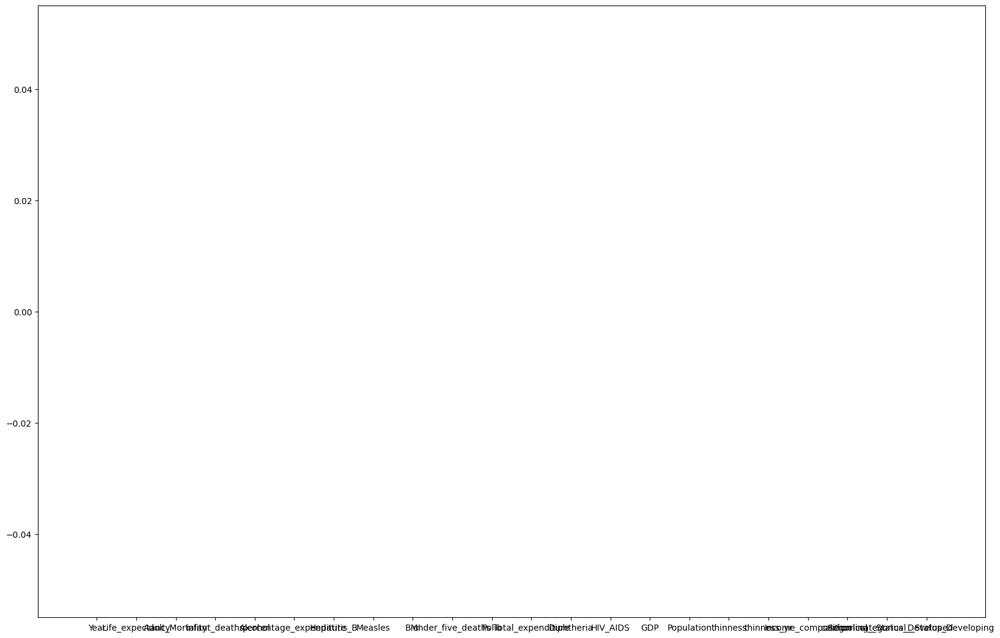

In [62]:
plt.bar(height = pd.Series(lasso.coef_), x = pd.Series(clean_data.columns))

In [63]:
# Create a function called lasso,
pred_lasso = lasso.predict(clean_data1_new)

In [64]:
# Adjusted r-square
s1 = lasso.score(clean_data1_new, Y_new.nCountry)
s1

0.0

In [65]:
# RMSE
np.sqrt(np.mean((pred_lasso - np.array(Y_new['nCountry']))**2))

56.07509252944458

## RIDGE REGRESSION

In [66]:
rm = Ridge(alpha = 0.13, normalize = True)

In [67]:
rm.fit(clean_data1_new, Y_new.nCountry)

Ridge(alpha=0.13, normalize=True)

In [68]:
# Coefficients values for all the independent vairbales
rm.coef_

array([  0.        ,   0.13303664,  -9.51413876,  11.73448191,
        -8.02849081, -21.29069879, -10.3668038 ,  -7.6966849 ,
         7.87760014,  12.36129899,   9.19190182,  13.48742012,
        -2.4045021 , -12.51673906,   1.62687057,   3.27802036,
        -2.86135689,  12.51806379,  -4.52710005,  -5.19872095,
         7.69082504,  -7.69082504])

In [69]:
result = rm.coef_.flatten()

In [70]:
rm.intercept_

101.98896034432943

<BarContainer object of 22 artists>

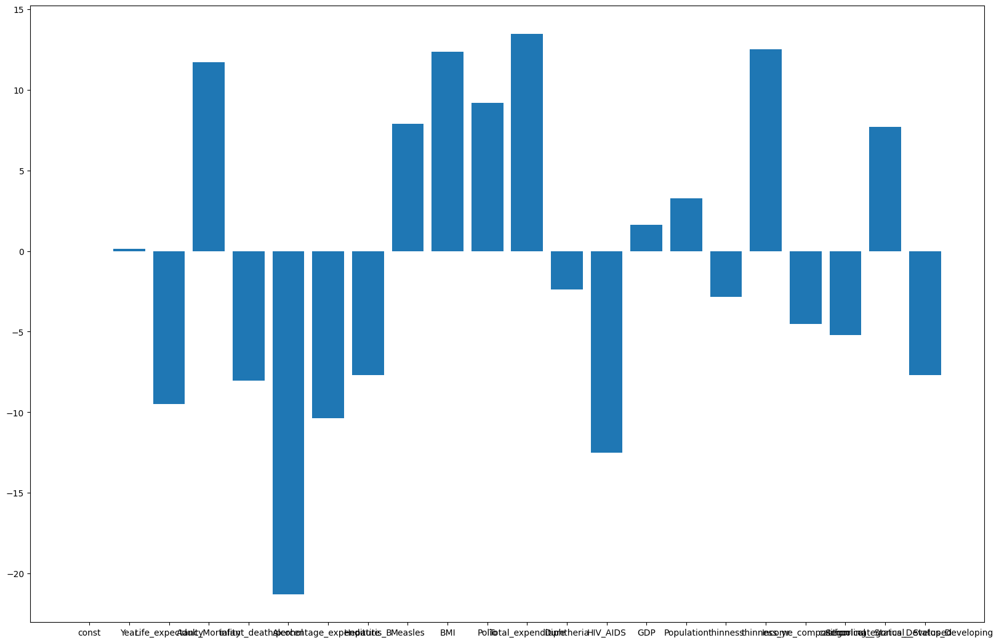

In [71]:
plt.bar(height = pd.Series(result), x = pd.Series(clean_data1_new.columns))

In [72]:
pred_rm = rm.predict(clean_data1_new)

In [73]:
# Adjusted r-square
s2 = rm.score(clean_data1_new, Y_new.nCountry)
s2

0.036176606920594545

In [74]:
# RMSE
np.sqrt(np.mean((pred_rm - np.array(Y_new['nCountry']))**2))

55.05144594358871

## ELASTIC NET REGRESSION

In [75]:
enet = ElasticNet(alpha = 0.13)

In [76]:
enet.fit(clean_data1_new, Y_new.nCountry)

ElasticNet(alpha=0.13)

In [77]:
# Coefficients values for all the independent vairbales
enet.coef_

array([ 0.        ,  0.        , -1.06830992,  4.20077072, -1.99943327,
       -7.52994474, -7.08320622, -3.5323982 ,  5.21246866,  3.41776697,
        2.67402451,  3.97431444, -0.1272325 , -6.99590455, -0.56780374,
        0.95623928,  1.18497343,  3.52808115, -2.15132995, -1.59258998,
        4.13228145, -4.13231047])

In [78]:
enet.intercept_

99.22279182468718

<BarContainer object of 22 artists>

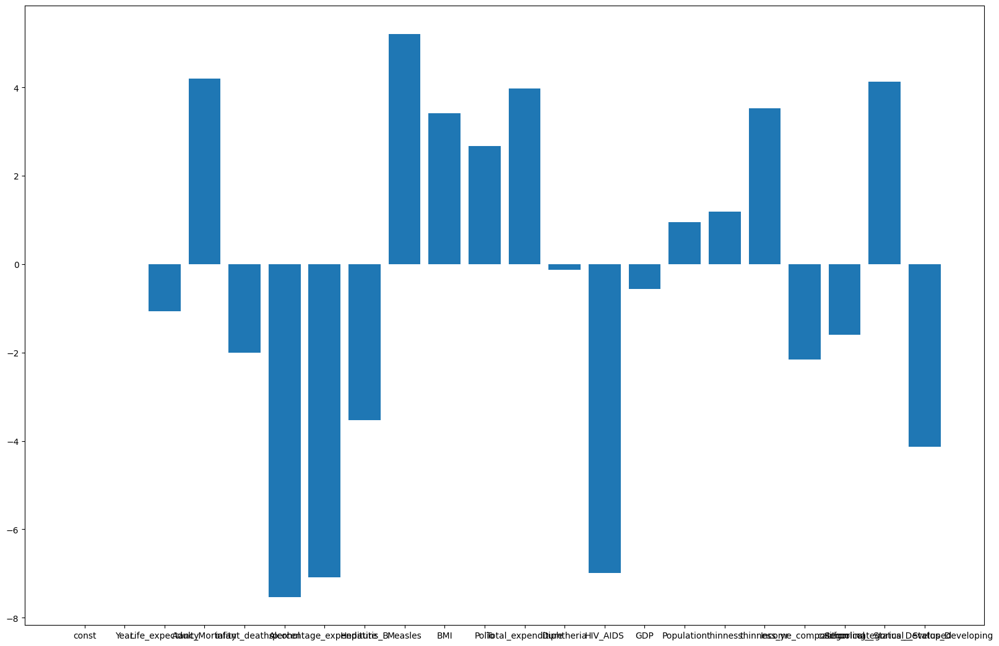

In [79]:
plt.bar(height = pd.Series(enet.coef_), x = pd.Series(clean_data1_new.columns))

In [80]:
pred_enet = enet.predict(clean_data1_new)

In [81]:
# Adjusted r-square
s3 = enet.score(clean_data1_new, Y_new.nCountry)
s3

0.022230215228479344

In [82]:
# RMSE
np.sqrt(np.mean((pred_enet - np.array(Y_new.nCountry))**2))

55.448308880337436

## Lasso Regression with GridSearchCV

In [83]:
lasso = Lasso()

In [84]:
parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5 ,10, 20]}

In [85]:
lasso_reg = GridSearchCV(lasso, parameters, scoring = 'r2', cv = 5)

In [86]:
lasso_reg.fit(clean_data1_new, Y_new.nCountry)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.0001, 0.001, 0.01, 1,
                                   5, 10, 20]},
             scoring='r2')

In [87]:
lasso_reg.best_params_

{'alpha': 5}

In [88]:
lasso_reg.best_score_

-39.32112467540436

In [89]:
lasso_pred = lasso_reg.predict(clean_data1_new)

In [90]:
# Adjusted r-square#
s4 = lasso_reg.score(clean_data1_new, Y_new.nCountry)
s4

0.0

In [91]:
# RMSE
np.sqrt(np.mean((lasso_pred - np.array(Y_new.nCountry))**2))

56.07509252944458

## Ridge Regression with GridSearchCV

In [92]:
ridge = Ridge()

In [93]:
ridge_reg = GridSearchCV(ridge, parameters, scoring = 'r2', cv = 5)

In [94]:
ridge_reg.fit(clean_data1_new, Y_new.nCountry)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.0001, 0.001, 0.01, 1,
                                   5, 10, 20]},
             scoring='r2')

In [95]:
ridge_reg.best_params_

{'alpha': 20}

In [96]:
ridge_reg.best_score_

-40.56036552342009

In [97]:
ridge_pred = ridge_reg.predict(clean_data1_new)

In [98]:
# Adjusted r-square#
s5 = ridge_reg.score(clean_data1_new, Y_new.nCountry)
s5

0.0372641007516884

In [99]:
# RMSE
np.sqrt(np.mean((ridge_pred - np.array(Y_new.nCountry))**2))

55.02037956498574

## ElasticNet Regression with GridSearchCV

In [100]:
enet = ElasticNet()

In [101]:
enet_reg = GridSearchCV(enet, parameters, scoring = 'r2', cv = 5)

In [102]:
enet_reg.fit(clean_data1_new, Y_new.nCountry)

GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.0001, 0.001, 0.01, 1,
                                   5, 10, 20]},
             scoring='r2')

In [103]:
enet_reg.best_params_

{'alpha': 5}

In [104]:
enet_reg.best_score_

-39.32112467540436

In [105]:
enet_pred = enet_reg.predict(clean_data1_new)

In [106]:
# Adjusted r-square
s6 = enet_reg.score(clean_data1_new, Y_new.nCountry)
s6

0.0

In [107]:
# RMSE
np.sqrt(np.mean((enet_pred - np.array(Y_new.nCountry))**2))

56.07509252944458

In [108]:
scores_all = pd.DataFrame({'models':['Lasso', 'Ridge', 'Elasticnet', 'Grid_lasso', 'Grid_ridge', 'Grid_elasticnet'], 'Scores':[s1, s2, s3, s4, s5, s6]})
scores_all

,models,Scores
0,Lasso,0.000000
1,Ridge,0.036177
2,Elasticnet,0.022230
3,Grid_lasso,0.000000
4,Grid_ridge,0.037264
5,Grid_elasticnet,0.000000


In [ ]:
# 'R squareed value is too low for all the models.'